In [1]:
from icevision.all import *

INFO     - Downloading default `.ttf` font file - SpaceGrotesk-Medium.ttf from https://raw.githubusercontent.com/airctic/storage/master/SpaceGrotesk-Medium.ttf to /home/ec2-user/.icevision/fonts/SpaceGrotesk-Medium.ttf | icevision.visualize.utils:get_default_font:69


In [2]:
import scipy.io
import os
import pandas as pd

class FaceParser(Parser):
    def __init__(self, template_record, data_dir, anns_file):
        super().__init__(template_record=template_record)
        
        self.data_dir = data_dir
        self.anns = scipy.io.loadmat(anns_file)

        folders = [x[0].split('--')[1] for x in os.walk(data_dir) if '--' in x[0] and 'people' not in x[0]]
        folders.sort()
        files = [n[0][0] for f in self.anns["file_list"] for n in f[0]]
        boxes = [n[0] for f in self.anns["face_bbx_list"] for n in f[0]]
        invalid = [n[0] for f in self.anns["invalid_label_list"] for n in f[0]]
        self.df = pd.DataFrame({"filename": files, "bbox": boxes, "invalid": invalid})
        self.df["directory"] = self.df.filename.apply(lambda x: x.split("_")[0]+"--"+self.get_folder(x, folders))

        self.class_map = ClassMap(["face"])

    def get_folder(self, s, folders):
        for f in folders:
            if f in s:
                return f    
        return 'people--driving--car'

    def __iter__(self) -> Any:
        for o in self.df.itertuples():
            yield o

    def __len__(self) -> int:
        return len(self.df)

    def record_id(self, o) -> Hashable:
        return o.filename

    def image_width_height(self, o) -> Tuple[int, int]:
        return get_img_size(self.data_dir / o.directory / (o.filename+".jpg"))

    def parse_fields(self, o, record, is_new):
        if is_new:
            record.set_filepath(self.data_dir / o.directory / (o.filename+".jpg"))
            record.set_img_size(self.image_width_height(o))
            record.detection.set_class_map(self.class_map)

        for box, invalid in zip(o.bbox, o.invalid):
            if invalid[0] == 0:
                record.detection.add_bboxes([BBox.from_xywh(*box)])
                record.detection.add_labels(["face"])

In [3]:
template_record = ObjectDetectionRecord()
data_dir = Path('/home/ec2-user/SageMaker/WIDER_train/images')
anns_file = Path('/home/ec2-user/SageMaker/wider_face_split/wider_face_train.mat')
parser = FaceParser(template_record, data_dir, anns_file)
template_record = ObjectDetectionRecord()

train_records, valid_records = parser.parse(cache_filepath= data_dir / "faces.pkl")

INFO     - Loading cached records from /home/ec2-user/SageMaker/WIDER_train/images/faces.pkl | icevision.parsers.parser:parse:126


In [4]:
len(train_records), len(valid_records)

(10304, 2576)

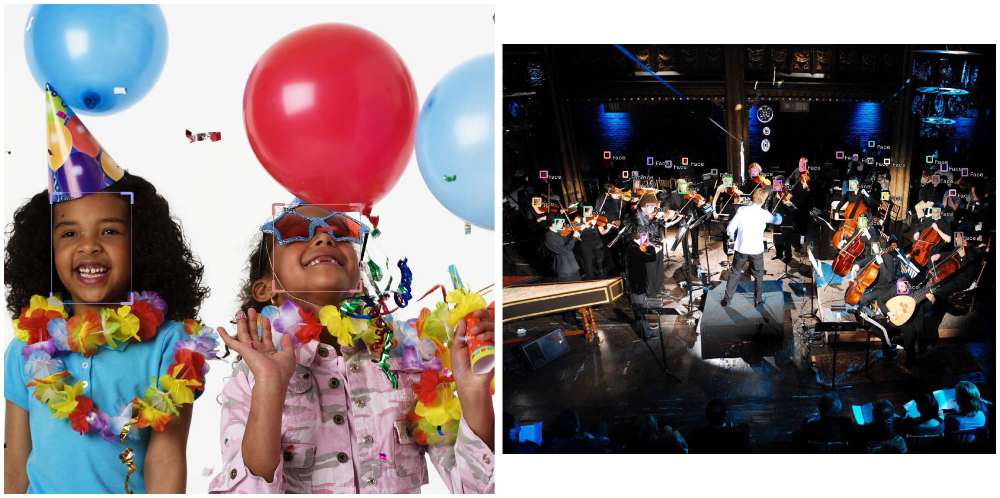

In [5]:
show_records(random.sample(valid_records, 2), class_map=parser.class_map, ncols=2)

In [6]:
d = aggregate_records_objects(train_records)

df = pd.DataFrame(d["common"]["img_size"])
df.describe()

,img_width,img_height
count,10304.0,10304.000000
mean,1024.0,887.950602
std,0.0,352.113651
min,1024.0,171.000000
25%,1024.0,682.000000
50%,1024.0,763.000000
75%,1024.0,1024.000000
max,1024.0,9108.000000


In [7]:
# df = pd.DataFrame(d["common"]["img_size"])
# df.describe()

In [8]:
df = pd.DataFrame(d["detection"]["bboxes"])
df.bbox_sqrt_area.describe()

count    125302.000000
mean         33.083430
std          52.958079
min           1.414214
25%          10.488088
50%          17.663522
75%          33.941125
max        1047.348557
Name: bbox_sqrt_area, dtype: float64

In [9]:
# df.bbox_sqrt_area.describe()

In [10]:
# pd.DataFrame(d["detection"]["bboxes"]).bbox_sqrt_area.describe()

In [11]:
# 60 * 1.5

# x1 = 5-5*.15
# x2 = 10*1.15

# x2 - x1, 5*1.5, 5-5*.5, 8/5 -1

In [12]:
presize = 960
size = 768
train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize, shift_scale_rotate=None), 
                             tfms.A.Normalize()])
valid_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(size), tfms.A.Normalize()])
#train_tfms = tfms.A.Adapter([*tfms.A.aug_tfms(size=size, presize=presize), tfms.A.Normalize()])

train_ds = Dataset(train_records, train_tfms)
valid_ds = Dataset(valid_records, valid_tfms)

len(train_ds), len(valid_ds)

(10304, 2576)

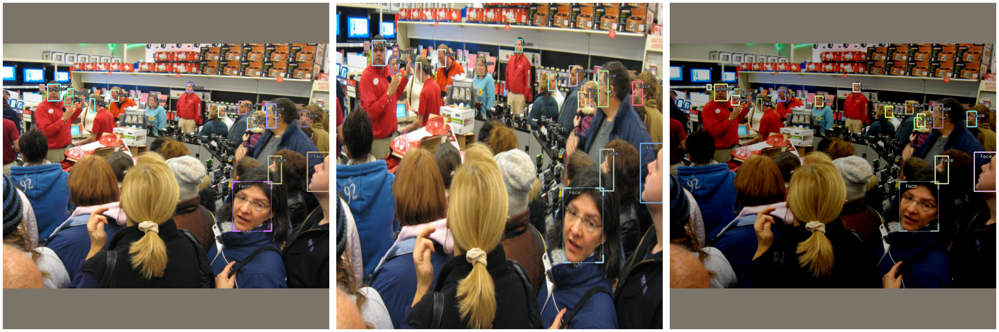

In [13]:
# Show an element of the train_ds with augmentation transformations applied
samples = [train_ds[0] for _ in range(3)]
show_samples(samples, ncols=3)

In [14]:
#model_type = models.torchvision.faster_rcnn
model_type = models.ultralytics.yolov5
#model_type = models.ross.efficientdet

In [15]:
# import multiprocessing
# multiprocessing.cpu_count()

In [16]:
bs = 24
train_dl = model_type.train_dl(train_ds, batch_size=bs, num_workers=8, shuffle=False)
valid_dl = model_type.valid_dl(valid_ds, batch_size=bs, num_workers=8, shuffle=False)

In [17]:
(x, y), recs = first(train_dl)
x.shape, y.shape

(torch.Size([24, 3, 768, 768]), torch.Size([142, 6]))

In [18]:
#backbone.pretrained

In [19]:
#backbone = model_type.backbones.tf_d0()
#model = model_type.model(backbone=backbone, num_classes=parser.class_map.num_classes, img_size=size)

In [20]:
# dl = model_type.valid_dl(valid_ds, batch_size=2, num_workers=2, shuffle=False)
# batch = first(dl)
# model_type.show_batch(batch, ncols=2)

In [21]:
backbone = model_type.backbones.small(pretrained=True)
#backbone = model_type.backbones.medium(pretrained=True)
#backbone = model_type.backbones.large(pretrained=True)

model = model_type.model(backbone=backbone, num_classes=parser.class_map.num_classes, 
                         img_size=size, device=torch.device("cuda"))

In [22]:
#model = model_type.model(num_classes=parser.class_map.num_classes)

In [23]:
from fastai.callback.tracker import SaveModelCallback

metrics = [COCOMetric(metric_type=COCOMetricType.bbox)]
cbs = SaveModelCallback(monitor='COCOMetric', fname="yolo_small")

learn = model_type.fastai.learner(dls=[train_dl, valid_dl], model=model, metrics=metrics, cbs=cbs)

In [24]:
#learn.lr_find()

In [25]:
#learn.fine_tune(epochs=50, base_lr=3e-4, freeze_epochs=5)

In [26]:
learn.fit_one_cycle(20, 2e-4)

epoch,train_loss,valid_loss,COCOMetric,time
0,1.277405,1.177342,0.099286,04:31
1,0.951114,0.914446,0.196498,04:10
2,0.856923,0.837991,0.225272,04:12
3,0.809106,0.808019,0.252068,04:11
4,0.780878,0.773036,0.273868,04:10
5,0.755789,0.751085,0.276511,04:12
6,0.737390,0.723599,0.291185,04:12
7,0.720935,0.703781,0.295741,04:08
8,0.708606,0.696540,0.310020,04:12
9,0.689728,0.690562,0.309562,04:07


Better model found at epoch 0 with COCOMetric value: 0.09928617266479822.
Better model found at epoch 1 with COCOMetric value: 0.19649823665231644.
Better model found at epoch 2 with COCOMetric value: 0.22527216249075854.
Better model found at epoch 3 with COCOMetric value: 0.25206786112602403.
Better model found at epoch 4 with COCOMetric value: 0.27386751751490096.
Better model found at epoch 5 with COCOMetric value: 0.2765112566518919.
Better model found at epoch 6 with COCOMetric value: 0.29118464290251556.
Better model found at epoch 7 with COCOMetric value: 0.29574107463652843.
Better model found at epoch 8 with COCOMetric value: 0.31002048544779987.
Better model found at epoch 10 with COCOMetric value: 0.3152640799559663.
Better model found at epoch 14 with COCOMetric value: 0.32042092844408465.
Better model found at epoch 15 with COCOMetric value: 0.324440102649557.
Better model found at epoch 17 with COCOMetric value: 0.326319949757363.
Better model found at epoch 18 with COCO

/home/ec2-user/anaconda3/envs/python3/lib/python3.6/site-packages/fastai/learner.py:54: UserWarning: Saved filed doesn't contain an optimizer state.
  elif with_opt: warn("Saved filed doesn't contain an optimizer state.")


<AxesSubplot:>

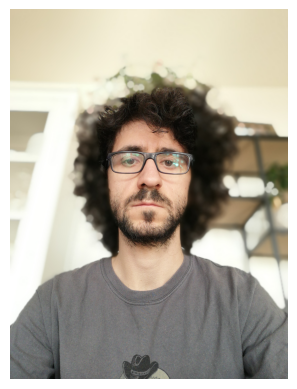

In [3]:
infer_tfms = tfms.A.Adapter([*tfms.A.resize_and_pad(768), tfms.A.Normalize()])

import PIL
def get_image(p):
    img = PIL.Image.open(p)
    return np.array(img)

imgs = [get_image(f"./models/fraface{i}.jpg") for i in range(1, 9)]

show_img(random.sample(imgs, 1)[0])

In [4]:
model_type = models.ultralytics.yolov5
backbone = model_type.backbones.small(pretrained=True)
model = model_type.model(backbone=backbone, num_classes=2, 
                         img_size=768, device=torch.device("cpu"))

model.load_state_dict(torch.load('./models/yolo_small.pth'))

  0%|          | 0.00/14.1M [00:00<?, ?B/s]

<All keys matched successfully>

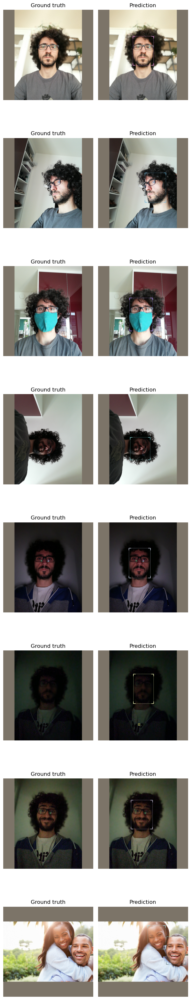

In [5]:
infer_ds = Dataset.from_images(imgs, infer_tfms)
preds = model_type.predict(model, infer_ds, keep_images=True)
show_preds(preds=preds)